# Evaluation Project 2 Avacado Project

By: Mr.Gaurav Kumar

Problem Statement:
Avocado is a fruit consumed by people heavily in the United States.

Content :

This data was downloaded from the Hass Avocado Board website in May of 2018 & compiled into a single CSV.

The table below represents weekly 2018 retail scan data for National retail volume (units) and price. Retail scan data comes directly from retailers’ cash registers based on actual retail sales of Hass avocados.

Starting in 2013, the table below reflects an expanded, multi-outlet retail data set. Multi-outlet reporting includes an aggregation of the following channels: grocery, mass, club, drug, dollar and military. The Average Price (of avocados) in the table reflects a per unit (per avocado) cost, even when multiple units (avocados) are sold in bags. The Product Lookup codes (PLU’s) in the table are only for Hass avocados. Other varieties of avocados (e.g. greenskins) are not included in this table.

Some relevant columns in the dataset:

Date - The date of the observation

AveragePrice - the average price of a single avocado

type - conventional or organic

year - the year

Region - the city or region of the observation

Total Volume - Total number of avocados sold

4046 - Total number of avocados with PLU 4046 sold

4225 - Total number of avocados with PLU 4225 sold

4770 - Total number of avocados with PLU 4770 sold

Inspiration /Label


The dataset can be seen in two angles to find the region and find the average price .

Task: One of Classification and other of Regression

Do both tasks in the same .ipynb file and submit at single file.

### import necessary library

In [1]:
import numpy as np,pandas as pd,seaborn as sns,matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv("avocado.csv")

In [3]:
df.shape

(18249, 14)

In [4]:
df

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,7,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,8,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,9,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,10,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico


as we see there is 14 columns and 18249 rows in which there is an column at index 0 is usless so we can drop it

In [5]:
df.drop(df.filter(regex="Unnamed"),axis=1, inplace=True)

In [6]:
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico


now the total columns are 13 now data is good move to next steps

#  EDA

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          18249 non-null  object 
 1   AveragePrice  18249 non-null  float64
 2   Total Volume  18249 non-null  float64
 3   4046          18249 non-null  float64
 4   4225          18249 non-null  float64
 5   4770          18249 non-null  float64
 6   Total Bags    18249 non-null  float64
 7   Small Bags    18249 non-null  float64
 8   Large Bags    18249 non-null  float64
 9   XLarge Bags   18249 non-null  float64
 10  type          18249 non-null  object 
 11  year          18249 non-null  int64  
 12  region        18249 non-null  object 
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


### the dataset contains float ,int and object datatypes there is something wrong with the date column which contains the data type is object which is in wrong format so we can change it

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          18249 non-null  object 
 1   AveragePrice  18249 non-null  float64
 2   Total Volume  18249 non-null  float64
 3   4046          18249 non-null  float64
 4   4225          18249 non-null  float64
 5   4770          18249 non-null  float64
 6   Total Bags    18249 non-null  float64
 7   Small Bags    18249 non-null  float64
 8   Large Bags    18249 non-null  float64
 9   XLarge Bags   18249 non-null  float64
 10  type          18249 non-null  object 
 11  year          18249 non-null  int64  
 12  region        18249 non-null  object 
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          18249 non-null  object 
 1   AveragePrice  18249 non-null  float64
 2   Total Volume  18249 non-null  float64
 3   4046          18249 non-null  float64
 4   4225          18249 non-null  float64
 5   4770          18249 non-null  float64
 6   Total Bags    18249 non-null  float64
 7   Small Bags    18249 non-null  float64
 8   Large Bags    18249 non-null  float64
 9   XLarge Bags   18249 non-null  float64
 10  type          18249 non-null  object 
 11  year          18249 non-null  int64  
 12  region        18249 non-null  object 
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


### now its in data format

## Statistical Analysis
##### Before Going for Statistical exploration of data, first check integrity of data & Missing value

## Data Integrity Check
##### Since dataset is large, Let check for any entry which is repeated or duplicated in dataset at same date.

In [10]:
df.duplicated().sum()

0

###  Missing Value check

In [11]:
df.isnull().sum()

Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

as we see there is no missing values in these columns

In [12]:
(df.isnull().sum()/df.shape[0])*100

Date            0.0
AveragePrice    0.0
Total Volume    0.0
4046            0.0
4225            0.0
4770            0.0
Total Bags      0.0
Small Bags      0.0
Large Bags      0.0
XLarge Bags     0.0
type            0.0
year            0.0
region          0.0
dtype: float64

In [13]:
# check missing data with the use of heatmap

<AxesSubplot:>

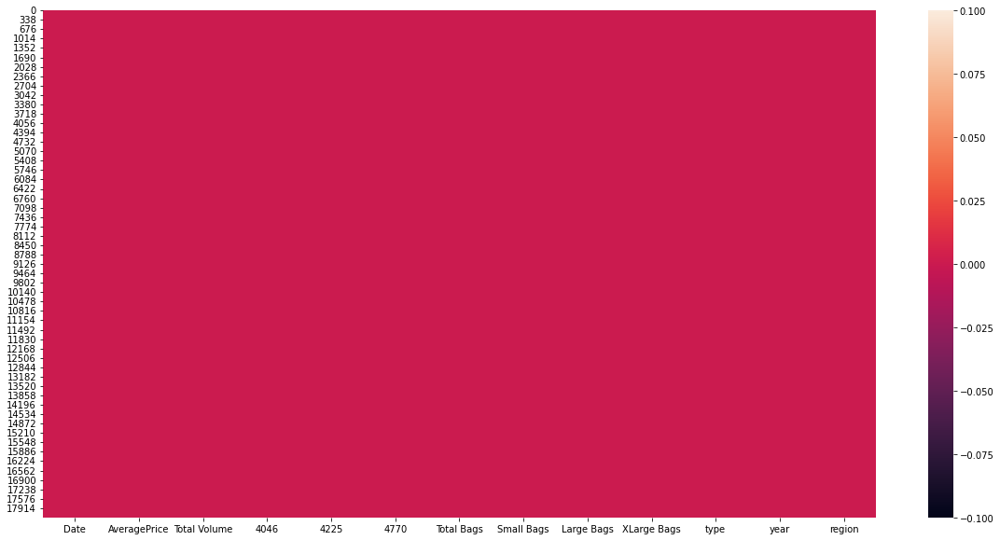

In [14]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isnull())

this looks very clear that there is no missing values or data in this dataset

<AxesSubplot:>

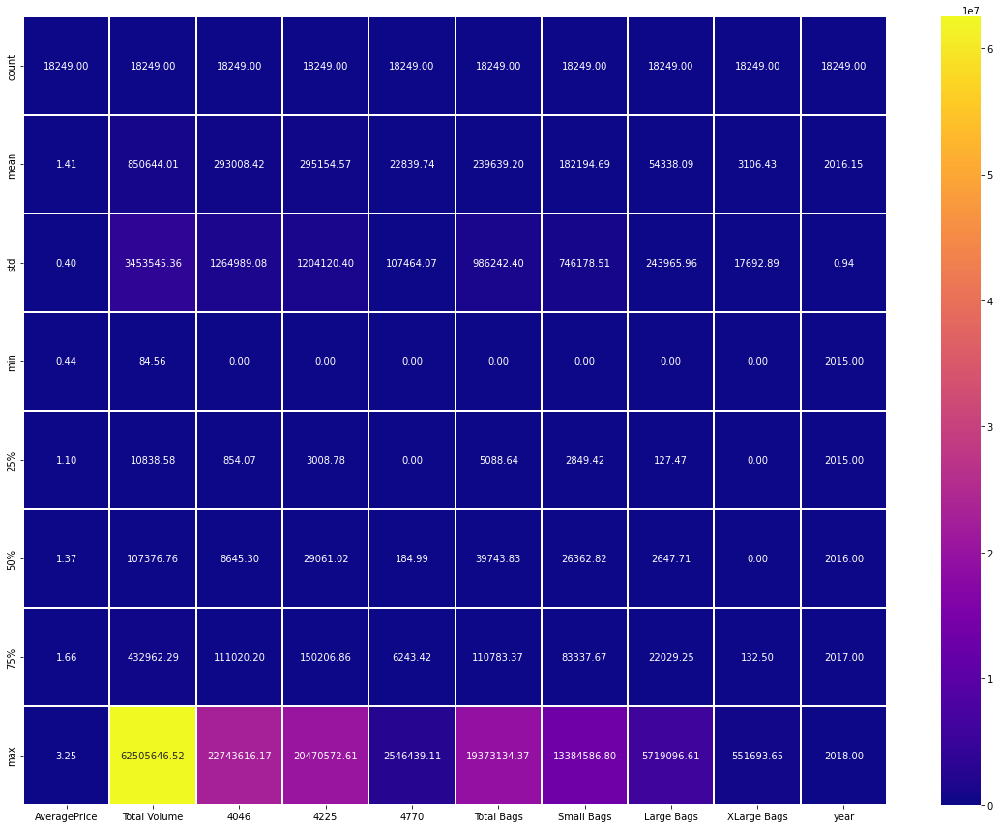

In [15]:
plt.figure(figsize=(20,15))
sns.heatmap(df.describe(),annot=True,fmt="0.2f",linewidth=0.1,linecolor='white',cmap='plasma')

In [16]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
AveragePrice,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25
Total Volume,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52
4046,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17
4225,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61
4770,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11
Total Bags,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37
Small Bags,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80
Large Bags,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61
XLarge Bags,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65
year,18249.0,2016.147899,9.399385e-01,2015.00,2015.00,2016.00,2017.00,2018.00


## Comment :
We can easily suspect that some of the features contain outliers after looking at 50% and max columns.

For most of columns have minimum value of zero.

Almost in all columns value of mean is greater than median. Data is right skewed.

For most of columns value of std. deviation is greater than mean i.e. data is spread.

# before moving to further steps we can check for the price of avocado ,what type of avacode is more in demand and in which region

In [17]:
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [18]:
# firstly we can check the min ,max and mean values to determined the highest and lowest price of the avocado

print('\033[1m'+"Min price of the avocado"+'\033[0m',df['AveragePrice'].min())
print('\033[1m'+"Max price of the avocado"+'\033[0m',df['AveragePrice'].max())
print('\033[1m'+"Mean price of the avocado"+'\033[0m',df['AveragePrice'].mean())

Min price of the avocado 0.44
Max price of the avocado 3.25
Mean price of the avocado 1.405978409775878


<AxesSubplot:title={'center':'Distribution Price'}, xlabel='AveragePrice', ylabel='Density'>

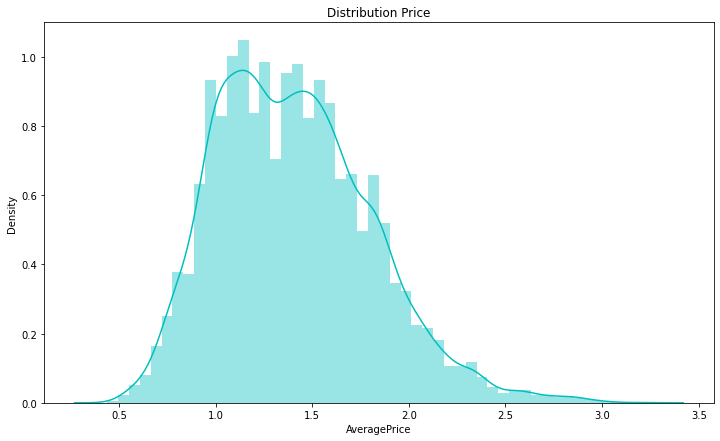

In [19]:
plt.figure(figsize=(12,7))
plt.title('Distribution Price')
sns.distplot(df["AveragePrice"], color='c')

In [20]:
df['type'].value_counts()

conventional    9126
organic         9123
Name: type, dtype: int64

as we see from above this that there are two type of avocaods conventional and organic both are in demands

In [21]:
df.groupby('type')['AveragePrice'].mean()

type
conventional    1.158040
organic         1.653999
Name: AveragePrice, dtype: float64

<AxesSubplot:xlabel='AveragePrice', ylabel='type'>

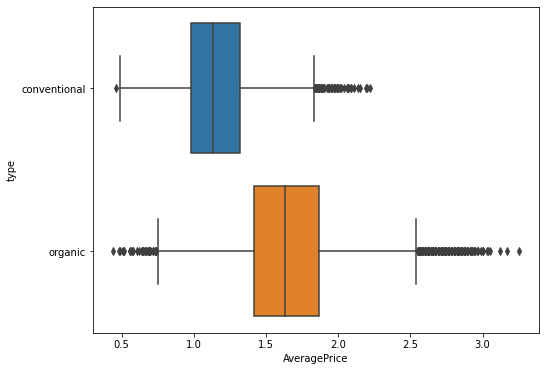

In [22]:
plt.figure(figsize=(8,6))
sns.boxplot(y="type", x="AveragePrice", data=df)

as we can see clearly the organic avocado is more coslier than the conventional avocados

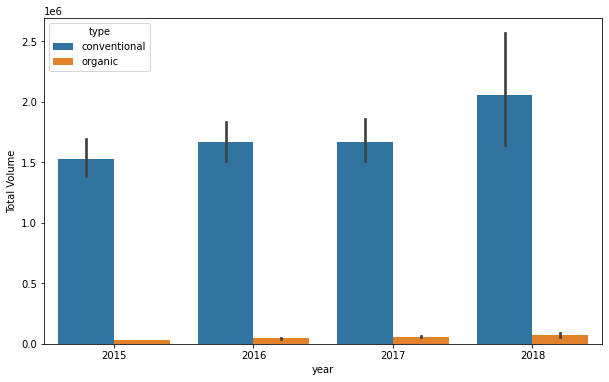

In [23]:
plt.figure(figsize=(10,6))
sns.barplot(x='year', y='Total Volume', hue='type',data=df)
plt.show()

we can clearly see that the convential avocados are more in demand than the organic 

### lets get more insight on the price with different regions 

In [24]:
pd.set_option("display.max_row",None)
pd.crosstab([df.type,df.region],[df.AveragePrice],margins=True)

AveragePrice                      0.44  0.46  0.48  0.49  0.51  0.52  0.53  \
type         region                                                          
conventional Albany                  0     0     0     0     0     0     0   
             Atlanta                 0     0     0     0     0     0     0   
             BaltimoreWashington     0     0     0     0     0     0     0   
             Boise                   0     0     0     0     0     0     0   
             Boston                  0     0     0     0     0     0     0   
             BuffaloRochester        0     0     0     0     0     0     0   
             California              0     0     0     0     0     0     0   
             Charlotte               0     0     0     0     0     0     0   
             Chicago                 0     0     0     0     0     0     0   
             CincinnatiDayton        0     0     0     0     0     0     0   
             Columbus                0     0     0     0     0     0     0   
             DallasFtWorth           0     0     0     0     0     0     0   
             Denver                  0     0     0     0     0     0     0   
             Detroit                 0     0     0     0     0     0     0   
             GrandRapids             0     0     0     0     0     0     0   
             GreatLakes              0     0     0     0     0     0     0   
             HarrisburgScranton      0     0     0     0     0     0     0   
             HartfordSpringfield     0     0     0     0     0     0     0   
             Houston                 0     0     0     0     1     0     2   
             Indianapolis            0     0     0     0     0     0     0   
             Jacksonville            0     0     0     0     0     0     0   
             LasVegas                0     0     0     0     0     0     0   
             LosAngeles              0     0     0     0     0     0     1   
             Louisville              0     0     0     0     0     0     0   
             MiamiFtLauderdale       0     0     0     0     0     0     0   
             Midsouth                0     0     0     0     0     0     0   
             Nashville               0     0     0     0     0     0     0   
             NewOrleansMobile        0     0     0     0     0     0     0   
             NewYork                 0     0     0     0     0     0     0   
             Northeast               0     0     0     0     0     0     0   
             NorthernNewEngland      0     0     0     0     0     0     0   
             Orlando                 0     0     0     0     0     0     0   
             Philadelphia            0     0     0     0     0     0     0   
             PhoenixTucson           0     1     0     1     2     1     3   
             Pittsburgh              0     0     0     0     0     0     0   
             Plains                  0     0     0     0     0     0     0   
             Portland                0     0     0     0     0     0     0   
             RaleighGreensboro       0     0     0     0     0     0     0   
             RichmondNorfolk         0     0     0     0     0     0     0   
             Roanoke                 0     0     0     0     0     0     0   
             Sacramento              0     0     0     0     0     0     0   
             SanDiego                0     0     0     0     0     0     0   
             SanFrancisco            0     0     0     0     0     0     0   
             Seattle                 0     0     0     0     0     0     0   
             SouthCarolina           0     0     0     0     0     0     0   
             SouthCentral            0     0     0     0     0     0     0   
             Southeast               0     0     0     0     0     0     0   
             Spokane                 0     0     0     0     0     0     0   
             StLouis                 0     0     0     0     0     0     0   
             Syracuse 

In [25]:
pd.set_option("display.max_row",None)
pd.crosstab([df.type,df.year],[df.AveragePrice],margins=True)

AveragePrice       0.44  0.46  0.48  0.49  0.51  0.52  0.53  0.54  0.55  0.56  \
type         year                                                               
conventional 2015     0     0     0     1     1     1     3     1     0     4   
             2016     0     0     0     0     1     0     0     3     2     4   
             2017     0     1     0     0     1     1     3     3     1     0   
             2018     0     0     0     0     0     0     0     0     0     2   
organic      2015     0     0     0     0     0     0     0     0     0     0   
             2016     0     0     0     0     0     0     0     0     0     0   
             2017     1     0     1     1     2     1     0     0     0     2   
             2018     0     0     0     0     0     0     0     0     0     0   
All                   1     1     1     2     5     3     6     7     3    12   

AveragePrice       ...  2.97  2.99  3.0  3.03  3.04  3.05  3.12  3.17  3.25  \
type         year  ...                                                        
conventional 2015  ...     0     0    0     0     0     0     0     0     0   
             2016  ...     0     0    0     0     0     0     0     0     0   
             2017  ...     0     0    0     0     0     0     0     0     0   
             2018  ...     0     0    0     0     0     0     0     0     0   
organic      2015  ...     0     0    0     0     0     0     0     0     0   
             2016  ...     0     1    0     1     0     0     1     0     1   
             2017  ...     1     1    2     0     1     1     0     1     0   
             2018  ...     0     0    0     0     0     0     0     0     0   
All                ...     1     2    2     1     1     1     1     1     1   

AveragePrice         All  
type         year         
conventional 2015   2808  
             2016   2808  
             2017   2862  
             2018    648  
organic      2015   2807  
             2016   2808  
             2017   2860  
             2018    648  
All                18249  

[9 rows x 260 columns]

In [26]:
df.groupby(['year','type'])['AveragePrice'].agg([min,max,np.mean,np.median])

min   max      mean  median
year type                                      
2015 conventional  0.49  1.59  1.077963    1.08
     organic       0.81  2.79  1.673324    1.67
2016 conventional  0.51  2.20  1.105595    1.08
     organic       0.58  3.25  1.571684    1.53
2017 conventional  0.46  2.22  1.294888    1.30
     organic       0.44  3.17  1.735521    1.72
2018 conventional  0.56  1.74  1.127886    1.14
     organic       1.01  2.30  1.567176    1.55

In [27]:
df.groupby(['year','type'])['Total Volume','Total Bags','Small Bags','Large Bags','XLarge Bags'].agg([sum])


Total Volume    Total Bags    Small Bags    Large Bags  \
                            sum           sum           sum           sum   
year type                                                                   
2015 conventional  4.296599e+09  7.481009e+08  6.194886e+08  1.231692e+08   
     organic       8.886943e+07  2.409134e+07  1.519414e+07  8.897192e+06   
2016 conventional  4.690250e+09  1.398101e+09  1.064426e+09  3.136371e+08   
     organic       1.306401e+08  6.505765e+07  4.206845e+07  2.298920e+07   
2017 conventional  4.766166e+09  1.541193e+09  1.145835e+09  3.713655e+08   
     organic       1.681399e+08  1.050962e+08  7.711715e+07  2.797352e+07   
2018 conventional  1.334206e+09  4.593696e+08  3.344334e+08  1.177311e+08   
     organic       4.853227e+07  3.216630e+07  2.630799e+07  5.852903e+06   

                   XLarge Bags  
                           sum  
year type                       
2015 conventional   5443128.28  
     organic              0.00  
2016 conventional  20038284.84  
     organic              0.00  
2017 conventional  23991658.41  
     organic           5513.93  
2018 conventional   7205184.07  
     organic           5407.80

### Comment :

Sales of Avacado in 2017 is more than 2016 so price hike is may be as result of increase in demand or some supply chain issue.

sales in turn Demand is also increase over time.

30 % increase in sale of organic avocado in 2017 compare to 2016, even when it is almost 50% costlier than conventional type.

There is also growth in demand of conventional type avocado year-wise but rate of growth of demand comparelative less than organic type. May be people becoming more health oriented.

XLarge Bags sales increase rapidly in 2017 compare to 2015.

If we look at trend from 2015 customer start buying buying Large or Xlarge bags compare to small bags in case of Conventional 
type.

May be quantity & discount offer by shop may be playing role here.

People choosing small bags of organic avocado over large.Price factor playing here.

### now we can plot the avocados price according with the time

In [28]:
a=df['Date'].to_list()

Text(0, 0.5, 'Average Price')

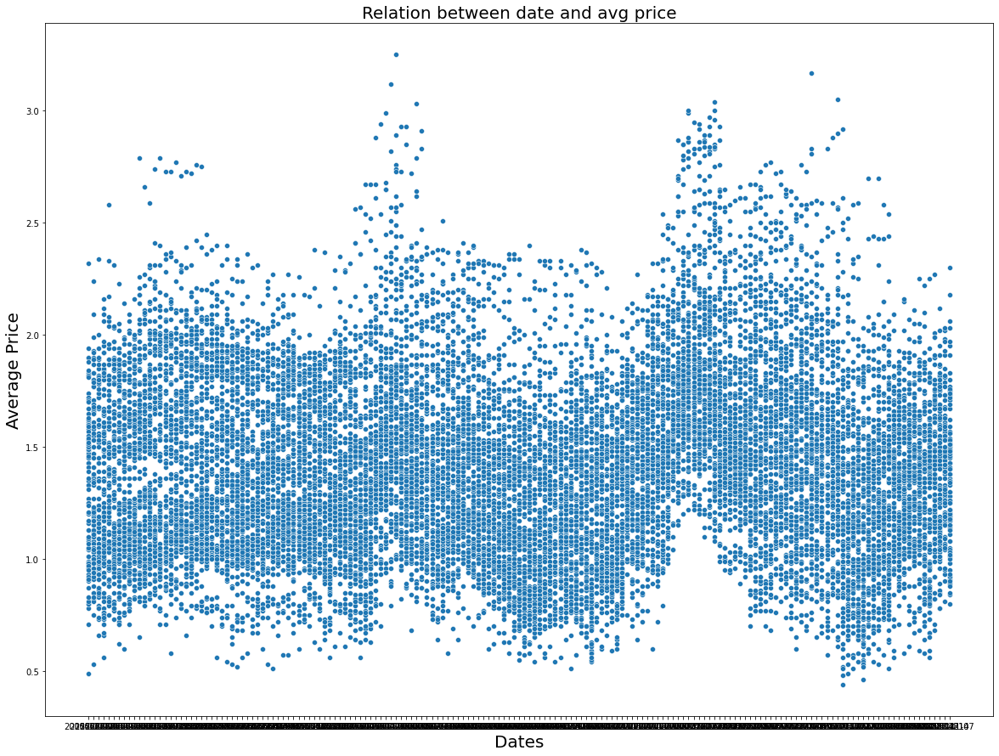

In [29]:
plt.figure(figsize=(20,15))
sns.scatterplot(x=a,y='AveragePrice',data=df,cmap='plasma')
plt.title("Relation between date and avg price",fontsize=20)
plt.xlabel("Dates",fontsize=20)
plt.ylabel("Average Price",fontsize=20)

In [30]:
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


### now plot the data to see the distribution 

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          18249 non-null  object 
 1   AveragePrice  18249 non-null  float64
 2   Total Volume  18249 non-null  float64
 3   4046          18249 non-null  float64
 4   4225          18249 non-null  float64
 5   4770          18249 non-null  float64
 6   Total Bags    18249 non-null  float64
 7   Small Bags    18249 non-null  float64
 8   Large Bags    18249 non-null  float64
 9   XLarge Bags   18249 non-null  float64
 10  type          18249 non-null  object 
 11  year          18249 non-null  int64  
 12  region        18249 non-null  object 
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


### now we can slice date column to year ,month and date

In [32]:
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [33]:
df['year'],df['month'], df['day'] = df['Date'].str.split('-').str

In [34]:
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,day
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,06
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


In [35]:
df['year']=df['year'].astype(int)
df['month']=df['month'].astype(int)
df['day']=df['day'].astype(int)

In [36]:
# now we can drop date and year column which is pre added in the dataset

df.drop(['Date'],axis=1,inplace=True)

In [37]:
df.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


### Univariate Analysis 

In [38]:
df.head(2)

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20


<AxesSubplot:xlabel='year', ylabel='count'>

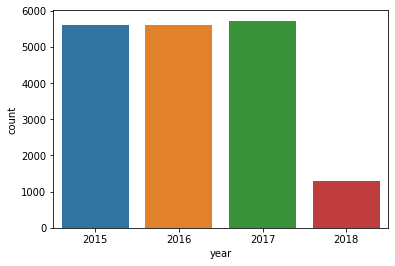

In [39]:
# Count plot with year column
sns.countplot('year',data=df)

as we see in 2017 there is large volumne of avocados to be sold then in 2016,2015 and lowest in 2018

In [40]:
df['year'].value_counts()

2017    5722
2016    5616
2015    5615
2018    1296
Name: year, dtype: int64

<AxesSubplot:xlabel='month', ylabel='count'>

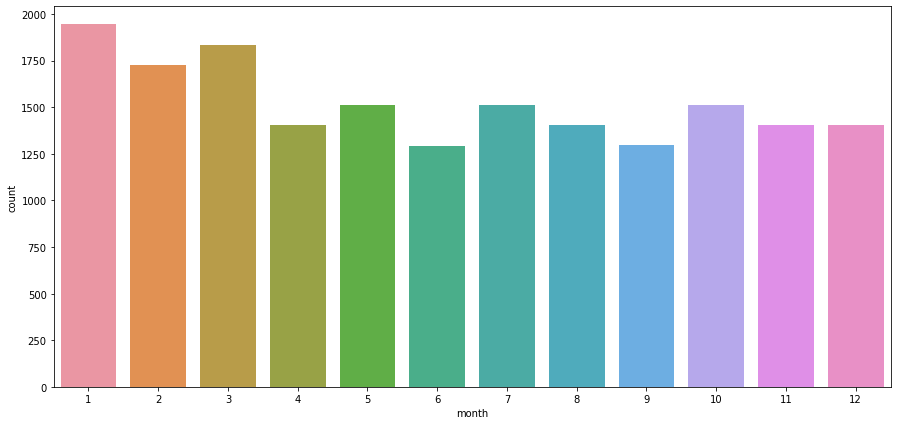

In [41]:
# checking month wise 
plt.figure(figsize=(15,7))
sns.countplot('month',data=df)

as we see that the maximimum sales is in jan ,feb and march month let see

In [42]:
df['month'].value_counts().max()

1944

In [43]:
df['month'].value_counts().min()

1294

<AxesSubplot:xlabel='month', ylabel='AveragePrice'>

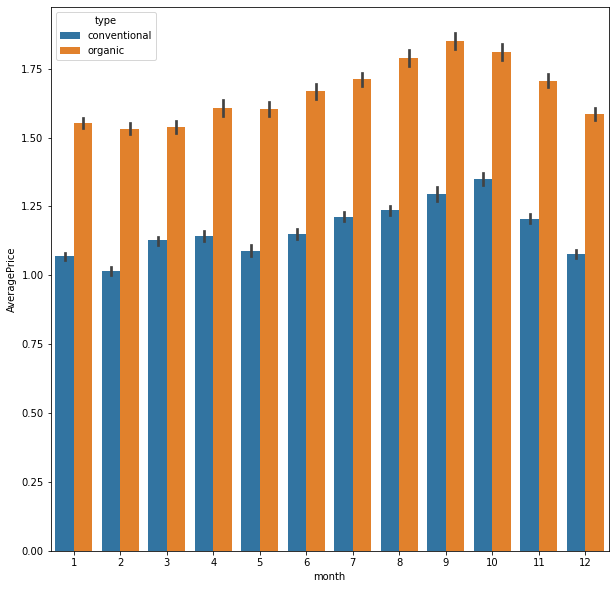

In [44]:
# checkin for the price for every month how much varies 

plt.figure(figsize=(10,10))
sns.barplot(x='month',y='AveragePrice',hue='type',data=df)

as we see the organic avacods sales are more than conventional in every month 

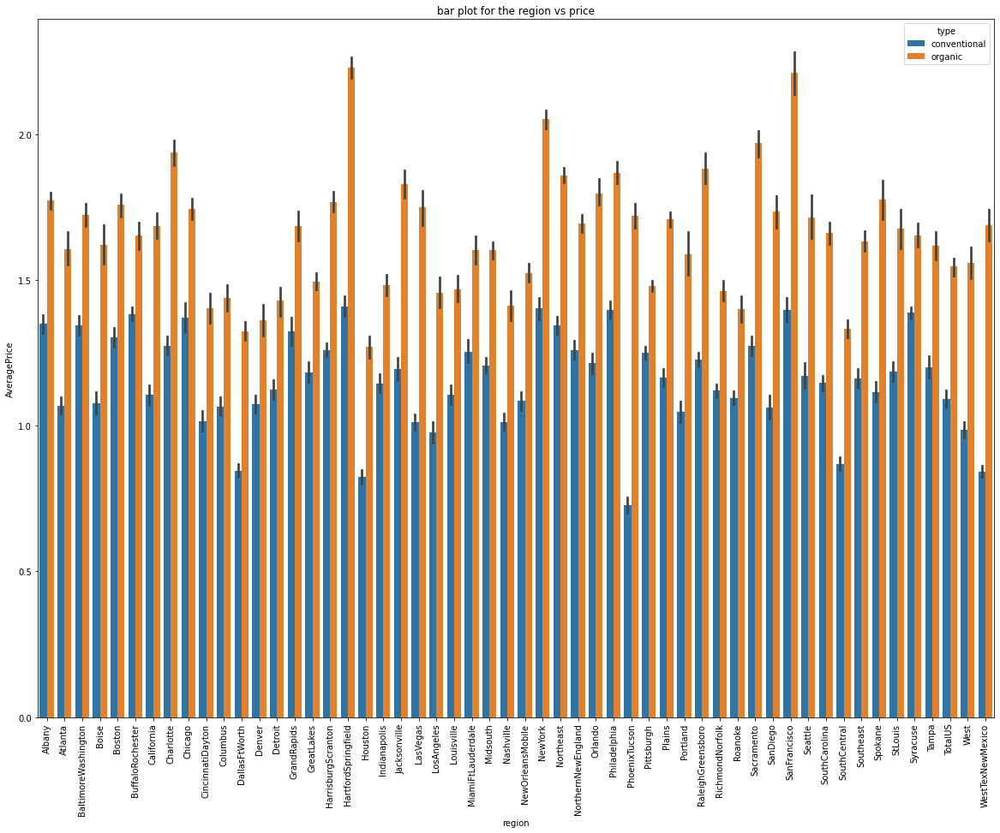

In [45]:
# now plot the price featurs with the regions which regeions havig highest sales with the type hue

plt.figure(figsize=(20,15))
sns.barplot(x='region',y='AveragePrice',data=df,hue='type')
plt.title("bar plot for the region vs price")
plt.xticks(rotation=90)
plt.show()

as we see organic avocados are moslty sales more in every region than the conventional 

In [46]:
df.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


In [47]:
df.groupby(['Total Volume'])['region']

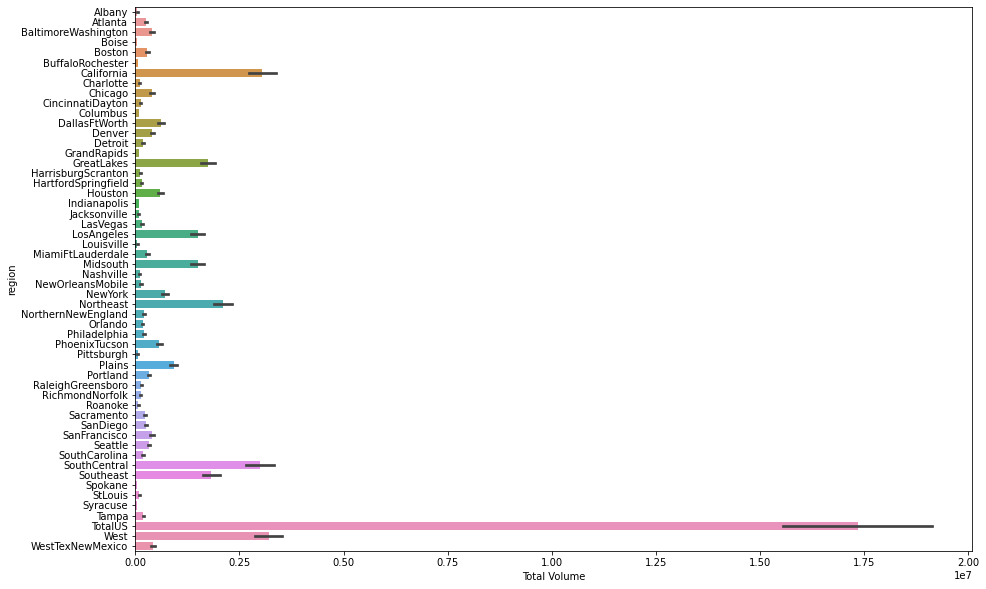

In [48]:
plt.figure(figsize=(15,10))
sns.barplot(x='Total Volume',y='region',data=df)
plt.show()

In [49]:
df.groupby(['region'])['Total Volume','Total Bags','Small Bags','Large Bags','XLarge Bags'].min()


,Total Volume,Total Bags,Small Bags,Large Bags,XLarge Bags
region,,,,,
Albany,774.20,503.44,503.44,0.00,0.0
Atlanta,3047.38,0.00,0.00,0.00,0.0
BaltimoreWashington,6884.09,352.36,327.43,0.00,0.0
Boise,562.64,7.02,0.00,0.00,0.0
Boston,1948.28,1042.30,1042.30,0.00,0.0
BuffaloRochester,379.82,320.00,320.00,0.00,0.0
California,70004.38,4836.22,4802.89,0.00,0.0
Charlotte,2390.22,280.00,270.25,0.00,0.0
Chicago,9910.84,33.33,30.00,0.00,0.0


In [50]:
df.groupby(['region'])['Total Volume','Total Bags','Small Bags','Large Bags','XLarge Bags'].max()


,Total Volume,Total Bags,Small Bags,Large Bags,XLarge Bags
region,,,,,
Albany,216738.47,36806.79,30126.31,27205.98,2900.00
Atlanta,957792.07,425991.21,292317.81,217337.59,10972.77
BaltimoreWashington,1225103.27,488208.25,483402.85,43483.00,13745.00
Boise,136377.55,93735.23,93645.45,40491.57,1231.57
Boston,999783.13,220254.40,215552.06,52294.16,4745.00
BuffaloRochester,201142.55,101271.16,101271.16,62156.06,5795.00
California,11213596.29,3462625.70,3403581.49,508755.56,86800.09
Charlotte,411160.94,223765.32,218181.70,17681.68,5520.00
Chicago,1802646.35,510679.10,143295.47,423185.75,11540.00


In [51]:
df.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


In [52]:
xf=df[['4046','4225','4770']]
yf=df['year']

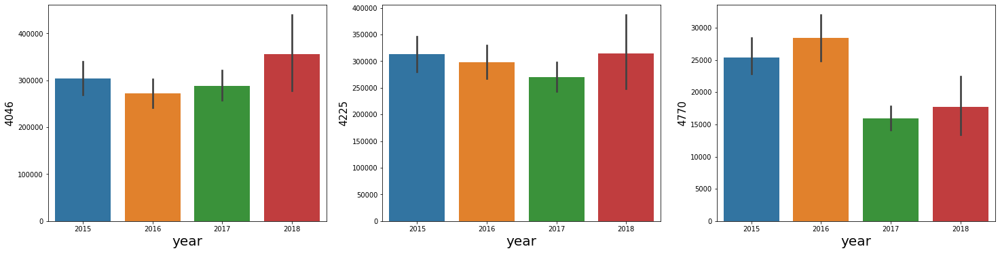

In [53]:
# now we can further plot other features
plt.figure(figsize=(25,20))
p=1
for i in xf:
    if p<=9:
        plt.subplot(3,3,p)
        sns.barplot(yf,xf[i])
        plt.xlabel('year',fontsize=20)
        plt.ylabel(i,fontsize=15)
        
    p+=1
plt.show()

Production of PLU 4046 has grown over the 4 years and is greater than the production of PLU 4225 and PLU 4770, which is least produced

In [54]:
df.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


In [55]:
# now its time for other features 

xb=df[['Total Bags','Small Bags','Large Bags','XLarge Bags']]
yb=df['year']

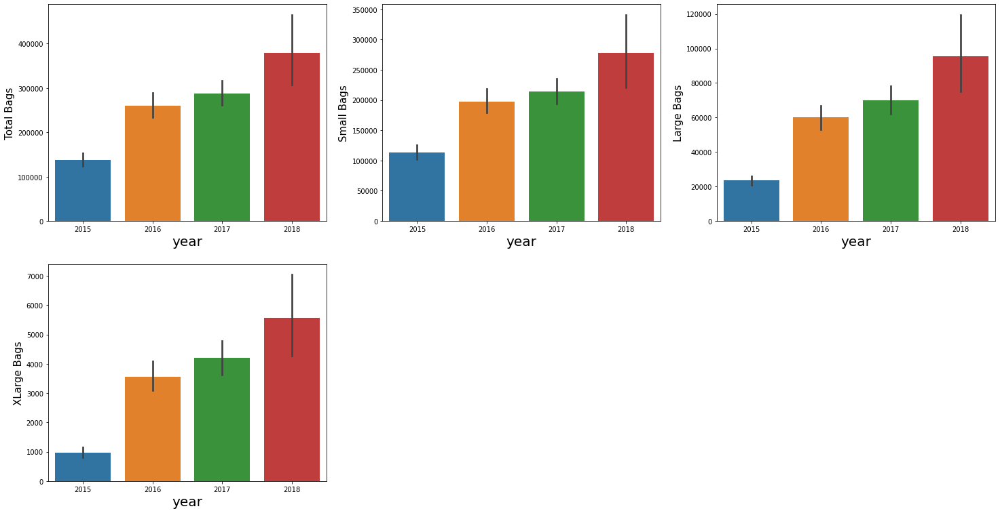

In [56]:
# now we can further plot other features
plt.figure(figsize=(25,20))
p=1
for i in xb:
    if p<=9:
        plt.subplot(3,3,p)
        sns.barplot(yb,xb[i])
        plt.xlabel('year',fontsize=20)
        plt.ylabel(i,fontsize=15)
        
    p+=1
plt.show()

Sale of all 3 types of bags has grown over the years.

Most of customers prefer buying Small Bags over Large and Xlarge bags.

There is very narrow Customer segment willing to buy XLarge type bags .

<AxesSubplot:xlabel='AveragePrice', ylabel='type'>

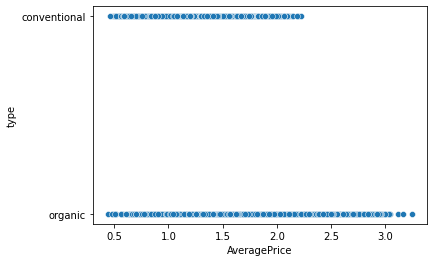

In [57]:
sns.scatterplot(x='AveragePrice',y='type',data=df)

<AxesSubplot:xlabel='Total Volume', ylabel='year'>

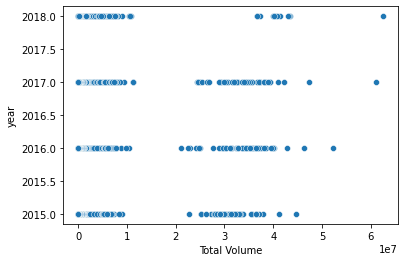

In [58]:
sns.scatterplot(x='Total Volume',y='year',data=df)

<AxesSubplot:xlabel='Total Volume', ylabel='Total Bags'>

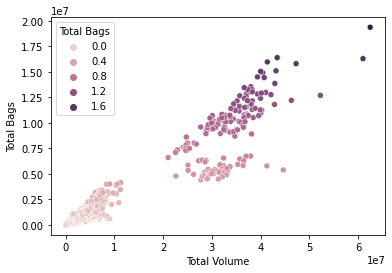

In [59]:
sns.scatterplot(x='Total Volume',y='Total Bags',hue='Total Bags',data=df)

In [60]:
df.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,day
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29


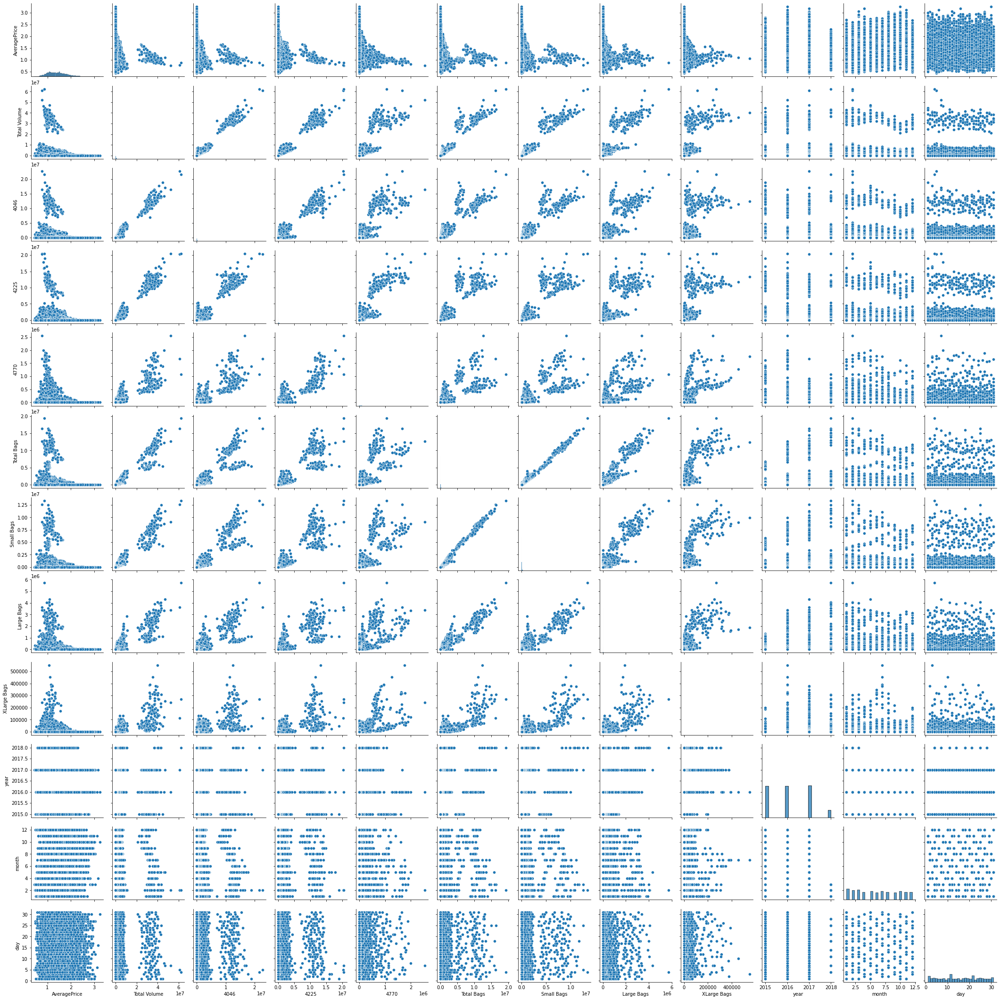

In [61]:
# pair plot
sns.pairplot(df)

In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AveragePrice  18249 non-null  float64
 1   Total Volume  18249 non-null  float64
 2   4046          18249 non-null  float64
 3   4225          18249 non-null  float64
 4   4770          18249 non-null  float64
 5   Total Bags    18249 non-null  float64
 6   Small Bags    18249 non-null  float64
 7   Large Bags    18249 non-null  float64
 8   XLarge Bags   18249 non-null  float64
 9   type          18249 non-null  object 
 10  year          18249 non-null  int32  
 11  region        18249 non-null  object 
 12  month         18249 non-null  int32  
 13  day           18249 non-null  int32  
dtypes: float64(9), int32(3), object(2)
memory usage: 1.7+ MB


### encoding the object variable 

In [63]:
from sklearn.preprocessing import LabelEncoder

In [64]:
le=LabelEncoder()

In [65]:
df['region']=le.fit_transform(df['region'])
df['type']=le.fit_transform(df['type'])

In [66]:
df['type'].unique()

array([0, 1])

In [67]:
df['region'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53])

### outliers detection  and removal 

In [68]:
df.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'type', 'year', 'region',
       'month', 'day'],
      dtype='object')

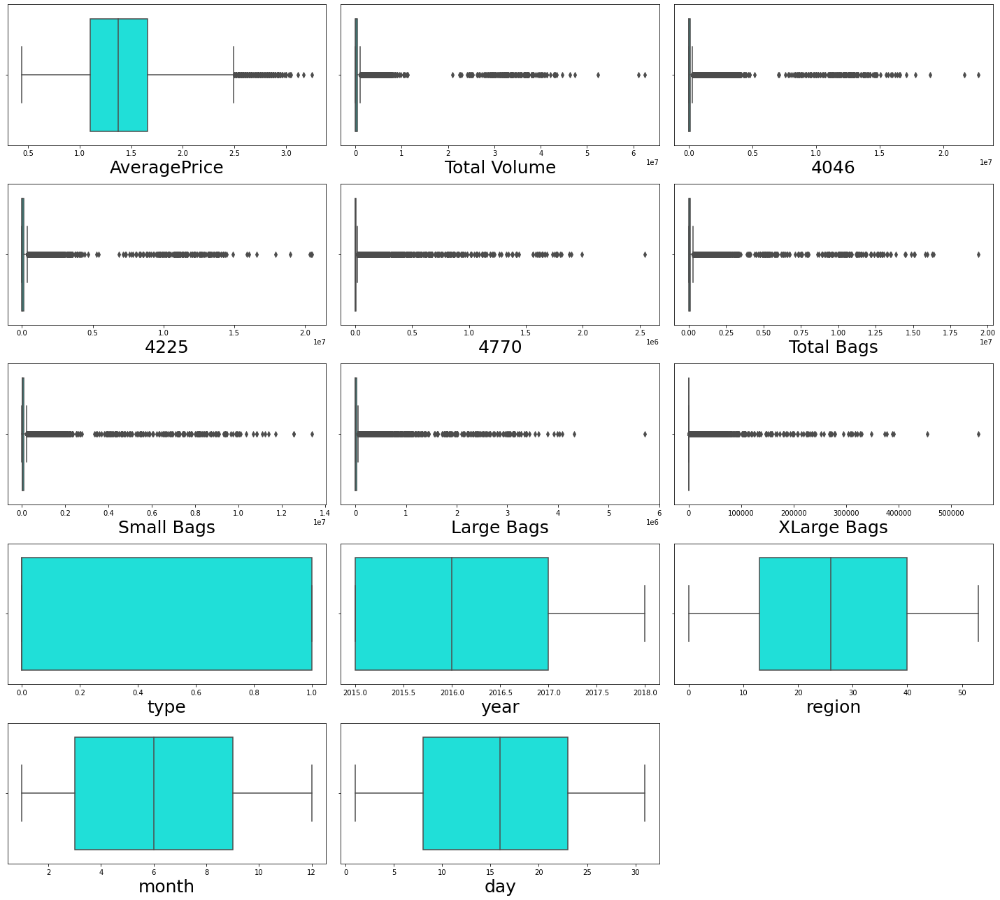

In [69]:
plt.figure(figsize=(20,18))
p=1
for i in df:
    if p<=15:
        plt.subplot(5,3,p)
        sns.boxplot(df[i],palette='hsv')
        plt.xlabel(i,fontsize=25)
    p+=1
plt.tight_layout()

as we see there is many outliers present in 'AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags'

#### we can use zscore to remove the outliers form the data 

In [70]:
from scipy.stats import zscore

In [71]:
z=np.abs(zscore(df))

In [72]:
df2=df.copy()

In [73]:
# we can take the threshold as less than 3 for the outliers removal
df3=df2[(z<3).all(axis=1)]

In [74]:
print("shape of dataset before outliers removal",df.shape)
print("shape of dataset after outliers removal",df3.shape)

shape of dataset before outliers removal (18249, 14)
shape of dataset after outliers removal (17651, 14)


In [75]:
print("\033[1m"+'Percentage Data Loss :'+"\033[0m",((18249-17651)/18249)*100,'%')

Percentage Data Loss : 3.276891884486821 %


as we see little data loss we can afford 

<AxesSubplot:>

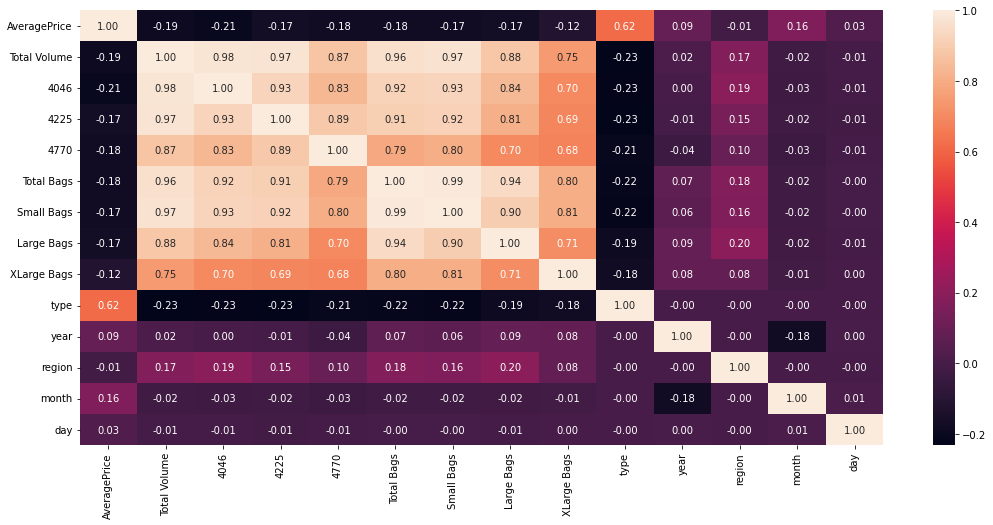

In [76]:
# now we can plot the coraltion plot
plt.figure(figsize=(18,8))
sns.heatmap(df.corr(),annot=True,fmt='0.2f')


as we see region is very poorly corelated with the dataset so we gona drop columns

1) we can drop the 4046,4225,4770 in my opionin this is the grade type of avocado so its doesnt require in the modeling step 

2) we also can drop the total bags column as it doest not required because we have other three bags values

In [77]:
df3.drop(columns=['4046','4225','4770','Total Bags','year','day'],axis=1, inplace=True)

Text(0.5, 1.0, 'corelation of average price with the features')

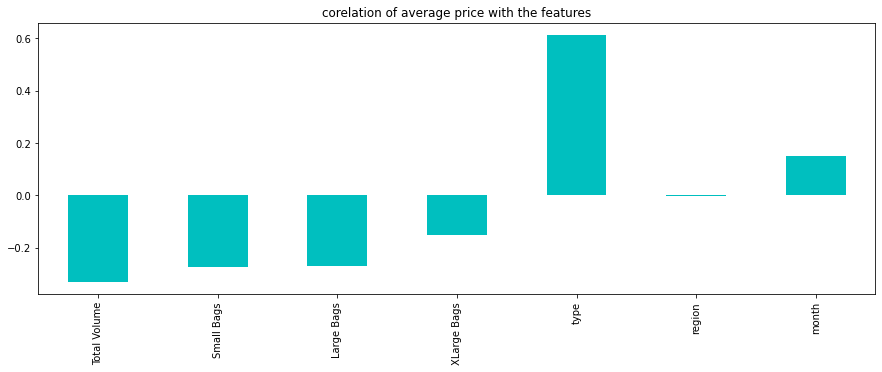

In [78]:
plt.figure(figsize=(15,5))
df3.corr()['AveragePrice'].drop(['AveragePrice']).plot(kind='bar',color='c')
plt.title("corelation of average price with the features")

### Now its time to check for the multicolinerarity  

In [79]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [80]:
vif=pd.DataFrame()

In [81]:
vif['vif_values']=[variance_inflation_factor(df3.values,i) for i in range(df3.shape[1])]
vif['features']=df3.columns

In [82]:
vif

,vif_values,features
0,9.506499,AveragePrice
1,7.618061,Total Volume
2,7.694491,Small Bags
3,1.982786,Large Bags
4,1.707216,XLarge Bags
5,3.479512,type
6,3.538824,region
7,4.019703,month


we can drop the year column as it contains values greator than 20 

### now we can chek for the skewness 

In [83]:
df3.skew()

AveragePrice    0.377432
Total Volume    3.767138
Small Bags      4.222706
Large Bags      5.053434
XLarge Bags     6.135607
type           -0.037741
region          0.012798
month           0.107408
dtype: float64

In [84]:
for col in df3.columns:
    if df3.skew().loc[col]>0.50:
        df3[col]=np.log1p(df3[col])

### now we can sacle the data 

In [85]:
from sklearn.preprocessing import StandardScaler

In [86]:
x=df3.drop('AveragePrice',axis=1)
y=df3['AveragePrice']

In [87]:
print(x.shape)
print(y.shape)

(17651, 7)
(17651,)


In [88]:
sc=StandardScaler()

In [89]:
x_scale=pd.DataFrame(sc.fit_transform(x),columns=x.columns)

In [90]:
x_scale

,Total Volume,Small Bags,Large Bags,XLarge Bags,type,region,month
0,-0.061962,-0.215789,-0.648254,-0.627319,-1.019047,-1.695495,1.644612
1,-0.134302,-0.179590,-0.636520,-0.627319,-1.019047,-1.695495,1.644612
2,0.218235,-0.243116,-0.621646,-0.627319,-1.019047,-1.695495,1.644612
3,0.033021,-0.384129,-0.552915,-0.627319,-1.019047,-1.695495,1.644612
4,-0.167601,-0.362677,-0.449388,-0.627319,-1.019047,-1.695495,1.362113
5,-0.125162,-0.325832,-0.565723,-0.627319,-1.019047,-1.695495,1.362113
6,0.058261,-0.235405,-0.577155,-0.627319,-1.019047,-1.695495,1.362113
7,0.182736,-0.344127,-0.171489,-0.627319,-1.019047,-1.695495,1.362113
8,0.140481,-0.112449,-0.353356,-0.627319,-1.019047,-1.695495,1.362113
9,0.005131,-0.242148,-0.170507,-0.627319,-1.019047,-1.695495,1.079614


### Modeling  

## this is Regression type 

In [91]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Ridge,Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn import neighbors
from math import sqrt
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor

In [92]:
# now check for the accuracy and random state 

maxacc=0
maxrs=0
for i in range(1,1000):
    x_train,x_test,y_train,y_test=train_test_split(x_scale,y,test_size=0.33,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    y_pred=lr.predict(x_test)
    accu=r2_score(y_test,y_pred)
    if accu>maxacc:
        maxacc=accu
        maxrs=i
print("maxacc is ",maxacc,"maxrs :",maxrs)
    

maxacc is  0.46992884149139624 maxrs : 557


### linear regresson 

In [93]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(x_scale, y, random_state=maxrs, test_size=.33)
lin_reg=LinearRegression()
lin_reg.fit(X_train,Y_train)
lin_reg.score(X_train,Y_train)
y_pred=lin_reg.predict(X_test)
print('\033[1m'+'Predicted Wins:'+'\033[0m\n',y_pred)
print('\n')
print('\033[1m'+'Actual Wins:'+'\033[0m\n',Y_test)

Predicted Wins:
 [1.09411981 1.23129101 1.61375155 ... 1.71664374 1.65694467 1.64125986]


Actual Wins:
 8841     1.35
859      1.19
17369    2.09
11190    1.05
14051    2.03
12917    1.38
973      0.79
2971     1.37
7330     1.68
15087    1.78
8767     1.17
8828     1.27
8787     1.13
14462    1.47
13812    1.79
11349    1.55
3350     1.15
17712    1.68
7714     1.15
1829     1.11
3445     1.15
3174     1.33
9878     1.86
15199    1.95
10687    1.65
5205     1.38
1566     1.07
9347     2.00
4633     1.49
7723     1.21
9072     1.30
11769    1.63
10380    1.44
15638    1.76
1981     1.01
16809    1.54
15140    2.03
802      1.10
11127    1.49
3473     0.83
446      1.26
11230    1.72
12017    1.29
5120     1.08
18147    1.40
875      1.07
4242     0.85
9565     1.65
16917    2.05
15247    0.77
5063     1.14
14215    1.26
7313     1.34
16537    1.23
7438     1.27
12691    1.69
10575    1.48
16130    1.96
15864    1.83
15092    1.76
13897    1.42
1991     1.01
13708    1.53
10997    1.69

### Evaluation matrix

In [94]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score
print('\033[1m'+' Error :'+'\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test,y_pred))
print('Mean squared error :', mean_squared_error(Y_test,y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(Y_test,y_pred)))
print('\n')
from sklearn.metrics import r2_score
print('\033[1m'+' R2 Score :'+'\033[0m')
print(r2_score(Y_test,y_pred,multioutput='variance_weighted'))

 Error :
Mean absolute error : 0.2242278055983644
Mean squared error : 0.08083297097712981
Root Mean Squared Error: 0.28431139790224697


 R2 Score :
0.46992884149139624


In [95]:
rf = RandomForestRegressor()
dtc = DecisionTreeRegressor()
adb=AdaBoostRegressor()
gradb=GradientBoostingRegressor()
rd=Ridge()
model = [rf,rd,dtc,adb,gradb]

for m in model:
    m.fit(X_train,Y_train)
    m.score(X_train,Y_train)
    y_pred = m.predict(X_test)
    print('\n')                                        
    print('\033[1m'+' Error of ', m, ':' +'\033[0m')
    print('Mean absolute error :', mean_absolute_error(Y_test,y_pred))
    print('Mean squared error :', mean_squared_error(Y_test,y_pred))
    print('Root Mean Squared Error:', np.sqrt(mean_squared_error(Y_test,y_pred)))
    print('\n')

    print('\033[1m'+' R2 Score :'+'\033[0m')
    print(r2_score(Y_test,y_pred)) 
    print('==============================================================================================================')



 Error of  RandomForestRegressor() :
Mean absolute error : 0.11805090128755363
Mean squared error : 0.027307610405150208
Root Mean Squared Error: 0.16525014494744084


 R2 Score :
0.8209273207630213


 Error of  Ridge() :
Mean absolute error : 0.2242287247460024
Mean squared error : 0.08083352416333482
Root Mean Squared Error: 0.28431237075325233


 R2 Score :
0.4699252139115979


 Error of  DecisionTreeRegressor() :
Mean absolute error : 0.15291330472103004
Mean squared error : 0.054137373390557936
Root Mean Squared Error: 0.232674393499925


 R2 Score :
0.6449881788971348


 Error of  AdaBoostRegressor() :
Mean absolute error : 0.22567067203608243
Mean squared error : 0.07861849034329235
Root Mean Squared Error: 0.2803898898735337


 R2 Score :
0.4844505434761619


 Error of  GradientBoostingRegressor() :
Mean absolute error : 0.1725908252716117
Mean squared error : 0.05022112152816606
Root Mean Squared Error: 0.22410069506399585


 R2 Score :
0.6706694341648259


### cross validation 

In [96]:
from sklearn.model_selection import cross_val_score

In [97]:
# Cross Validation
model = [rf,rd,dtc,adb,gradb]

for m in model:
    score = cross_val_score(m, x_scale, y, cv =5)
    print('\n')
    print('\033[1m'+'Cross Validation Score :',m,":"+'\033[0m\n')
    print("Mean CV Score :",score.mean())
    print('==============================================================================================================')



Cross Validation Score : RandomForestRegressor() :

Mean CV Score : -0.06460357973328608


Cross Validation Score : Ridge() :

Mean CV Score : -0.023805568915748032


Cross Validation Score : DecisionTreeRegressor() :

Mean CV Score : -0.5435538334950112


Cross Validation Score : AdaBoostRegressor() :

Mean CV Score : -0.1694943130960162


Cross Validation Score : GradientBoostingRegressor() :

Mean CV Score : 0.08496051499598675


### Hyper Parameter Tuning : GridSearchCV

In [98]:
from sklearn.model_selection import GridSearchCV

In [99]:
GBR=GradientBoostingRegressor()
search_grid={'n_estimators':[500,1000,2000],'learning_rate':[.001,0.01,.1],'max_depth':[1,2,4],'subsample':[.5,.75,1],'random_state':[1]}
search=GridSearchCV(GradientBoostingRegressor(),param_grid=search_grid,cv=5)

In [100]:
search.fit(x_scale,y)
#search.best_params_

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [1, 2, 4],
                         'n_estimators': [500, 1000, 2000], 'random_state': [1],
                         'subsample': [0.5, 0.75, 1]})

In [101]:
search.best_params_

{'learning_rate': 0.1,
 'max_depth': 2,
 'n_estimators': 1000,
 'random_state': 1,
 'subsample': 0.5}

# Final model


In [104]:
final_mod=GradientBoostingRegressor(learning_rate=0.1,max_depth=2,n_estimators=1000,random_state=1,subsample=0.5)
final_mod.fit(x_train,y_train)
y_pred=final_mod.predict(x_test)
print('\n')                                        
print('\033[1m'+' Error in Final Model :' +'\033[0m')
print('Mean absolute error :', mean_absolute_error(y_test,y_pred))
print('Mean squared error :', mean_squared_error(y_test,y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test,y_pred)))
print('\n')
print('\033[1m'+' R2 Score of Final Model :'+'\033[0m')
print(r2_score(y_test,y_pred)) 
print('\n')



 Error in Final Model :
Mean absolute error : 0.15664676608905626
Mean squared error : 0.04187888822842855
Root Mean Squared Error: 0.20464331953041748


 R2 Score of Final Model :
0.7263348069094273




In [105]:
import joblib

joblib.dump(final_mod,'avocado.pkl')

['avocado.pkl']

 True Values Vs Predicted Value plot :


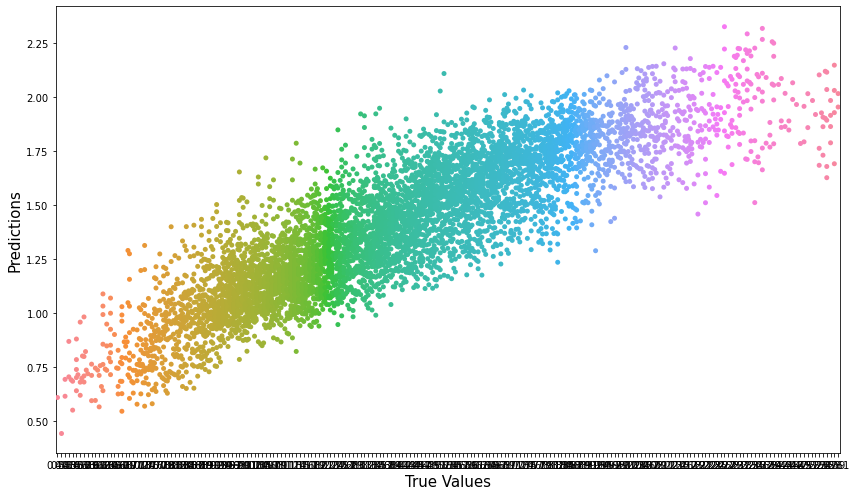

In [109]:
plt.figure(figsize=(12,7))
y_pred=final_mod.predict(X_test)
sns.swarmplot(Y_test.round(2), y_pred)
print('\033[1m'+' True Values Vs Predicted Value plot :' +'\033[0m')
plt.xlabel('True Values' , fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.tight_layout()